#Assignment 1: Submit a write-up on the following:

- Hugging face agents

- Hugging face pipeline for text generation

- HF inference endpoints

- Give feedback on the image generation and explore different models available on the Hugging Face website



#Assignment 2: Using OpenAI's CLIP Model for Image Captioning and Building an Image Search Engine

#Objective

##In this assignment, you will use OpenAI's CLIP (Contrastive Language-Image Pre-training) model to:
- Generate captions for 15 different images.
- Build a search engine for these images using a larger dataset of images.


##Part 1: Generate Captions for Images

##Part 2: Build an Image Search Engine


##Submission
Submit the following as a **Streamlit** app:

- Your Python code for generating captions and building the search engine.
- A report describing your approach, challenges faced, and how you overcame them.
- Screenshots of the interface and results.

Evaluation Criteria

- Correctness and efficiency of the code.
- Clarity and completeness of the report.
- Usability and functionality of the search engine interface.

#Please don't use any Generative AI Models

**Hugging face agents**

Hugging Face Agents are essentially specialized helpers that aid with a range of AI-related activities, including text classification, language translation, and text generation.

*example*: chatbot with the ability to categorize text, translate languages, and respond to inquiries. It is possible to build a Hugging Face Agent that utilizes the relevant models from the Hub to carry out these actions without the need for manual integration and management of several models for each job.

**Hugging face pipeline for text generation**
When producing text using trained language models, the text production pipeline is especially helpful.
*example:*
from transformers import pipeline
text_generator = pipeline('text-generation', model='any hugging face model')
output = text_generator("قصة تتحدث عن عصر الذكاء الاصطناعي", max_length=256)

**HF inference endpoints**

It's a high-level API that makes using pre-trained models for different NLP tasks—like text generation—easier. Tokenization, model loading, and output generation are made simpler for users to handle by the pipeline, which encapsulates these complex processes. To put it simply, it works like a series of steps where stop words are removed first, then tokenization, and so on.

*example:*
import requests

API_URL = " "
headers = {"Authorization": " "}

def query(payload):
    response = requests.post(API_URL, headers=headers, json=payload)
    return response.json()

data = query({
    "inputs": "",
})


**Give feedback on the image generation and explore different models available on the Hugging Face website**
1. "stabilityai/stable-diffusion-xl-base-1.0"
   - Advantages: Excellent image production for English prompts.
   - Weaknesses: Poor Arabic text performance.

2. "CompVis/stable-diffusion-v1-4"
   - Strengths: Effective picture creation for prompts in English.
   - Weaknesses: Poor performance, particularly in Arabic, while reading non-English content.

- For English Prompts: - For optimal outcomes, stick with `stabilityai/stable-diffusion-xl-base-1.0}.
   Examine `runwayml/stable-diffusion-v1-5} to see if it can help with performance.

- Regarding Arabic Prompts: Both models have limitations at the moment. Seeking for models that have been specially trained on multilingual datasets or holding out for updates that enhance the processing of non-English text could prove advantageous.
   - As an alternative, inquire about possible adjustments or modifications to better handle Arabic text from the model creators or the community.




**Image Captioning**

In [1]:
import torch
from PIL import Image
from transformers import CLIPProcessor, CLIPModel
import requests
from io import BytesIO
import os


In [2]:
from matplotlib import pyplot as plt
import numpy as np
from PIL import Image
import requests
images_url =["/content/image1.jpeg",
             "/content/image2.jpeg",
             "/content/image3.jpeg",
             "/content/image4.jpeg",
             "/content/image5.jpeg",
             "/content/image6.jpeg",
             "/content/image7.jpeg",
             "/content/image8.jpeg",
             "/content/image9.jpeg",
             "/content/image10.jpeg",
             "/content/image11.jpeg",
             "/content/image12.jpeg",
             "/content/image13.jpeg",
             "/content/image14.jpeg",
            "/content/image15.jpeg"
             ]
images = []

for filename in images_url:
    image = Image.open(filename)
    images.append(image)

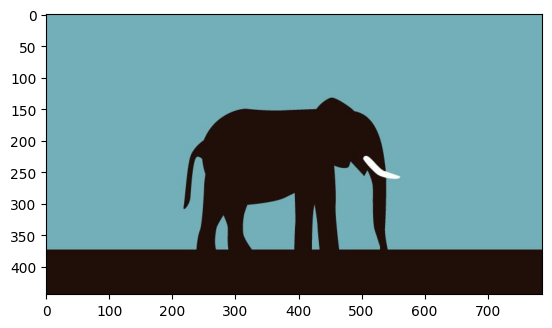

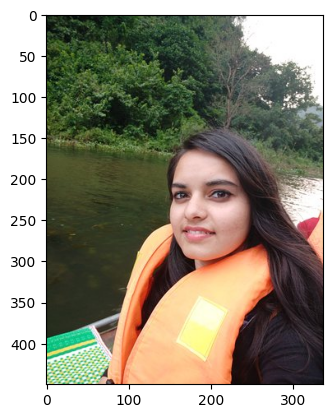

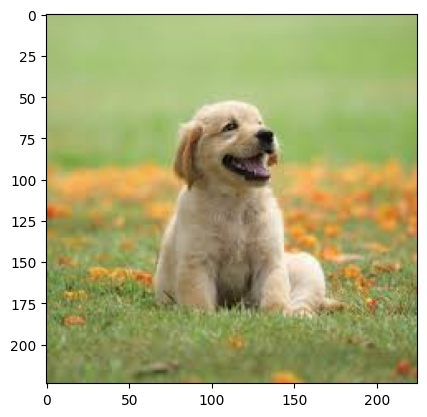

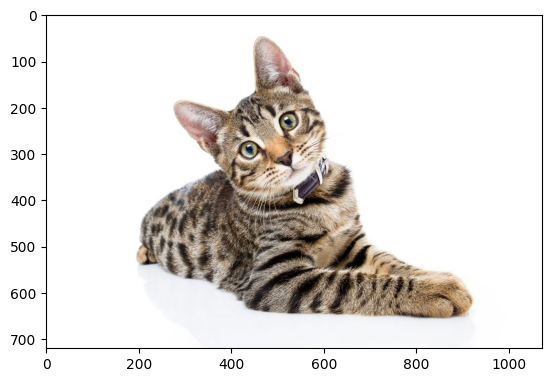

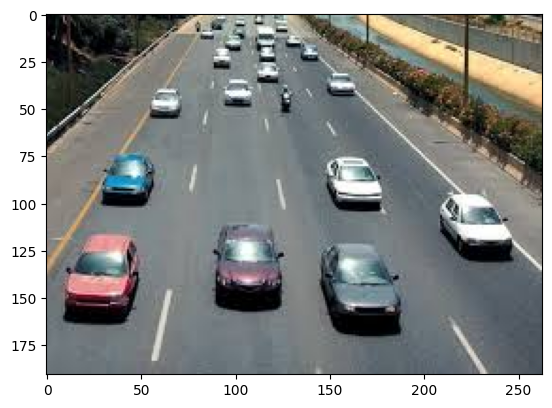

...

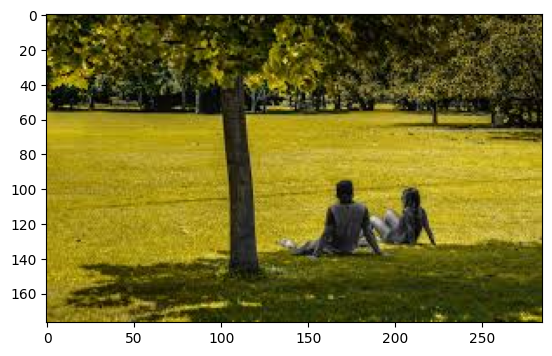

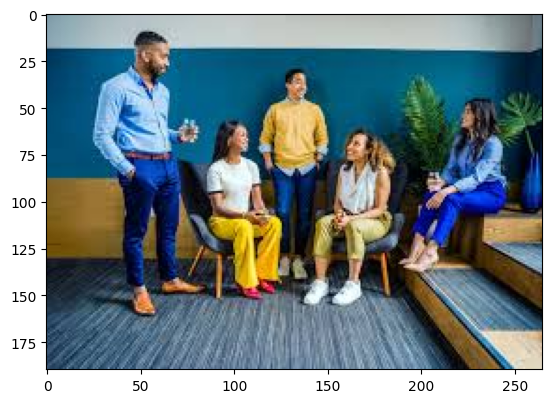

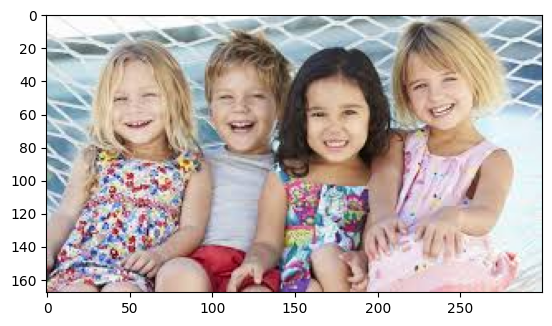

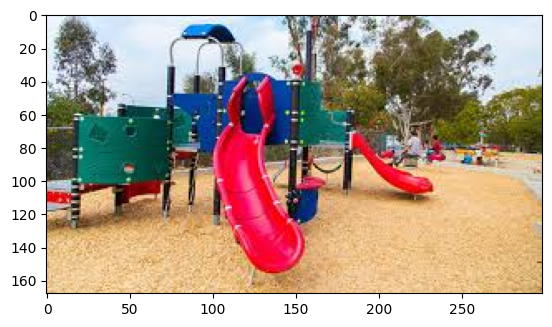

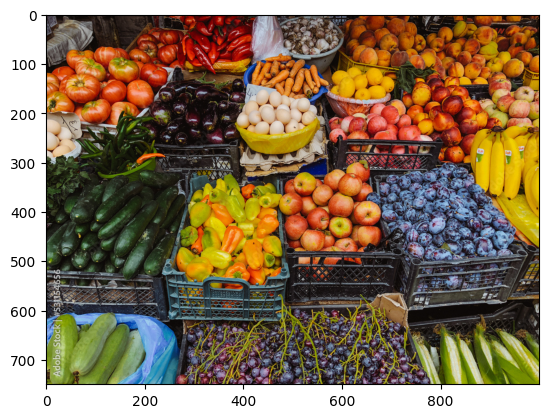

In [3]:
for image in images:
    plt.show(plt.imshow(np.asarray(image)))

In [4]:
from transformers import BlipProcessor, BlipForConditionalGeneration


processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base")


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1249: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


an elephant standing on a hill with a blue sky in the background


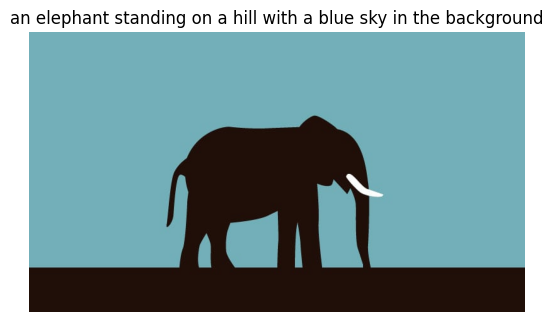

a woman in a boat with a book


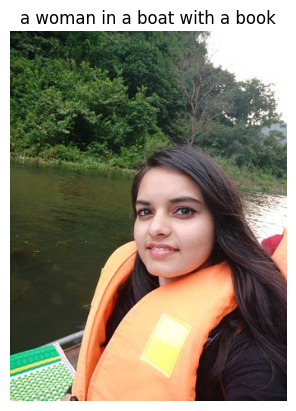

a puppy sitting in the grass


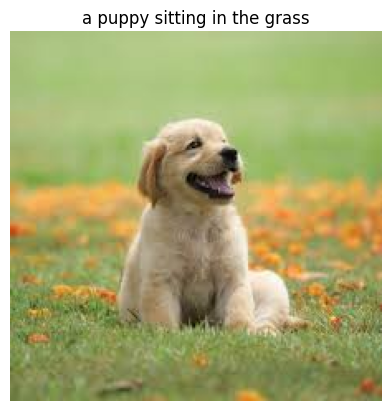

a tab cat lying down on the floor


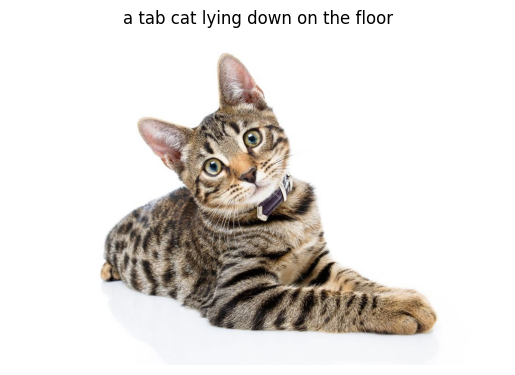

a highway with cars


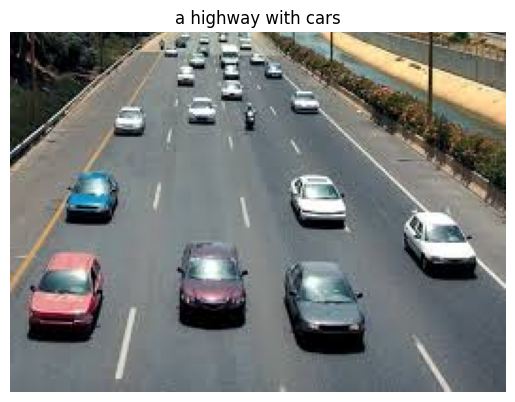

a mother elephant and her baby walking through the grass


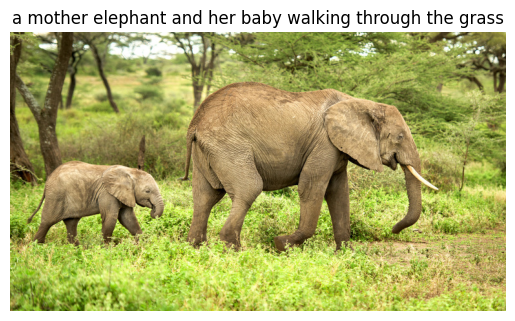

a lion laying in the grass


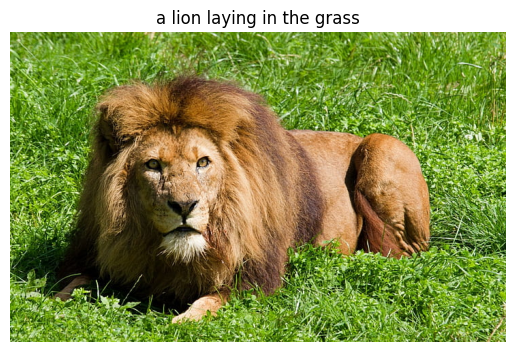

toyota aur 1 5l at


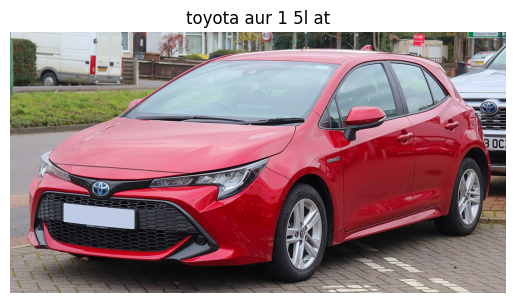

cars 2 the movie


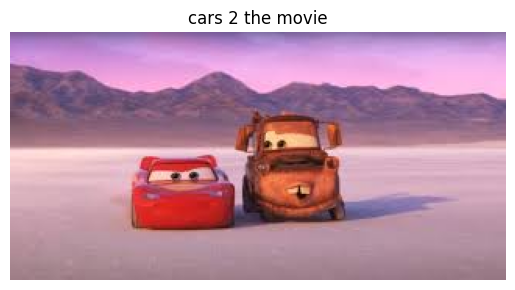

people walking down a path in the park


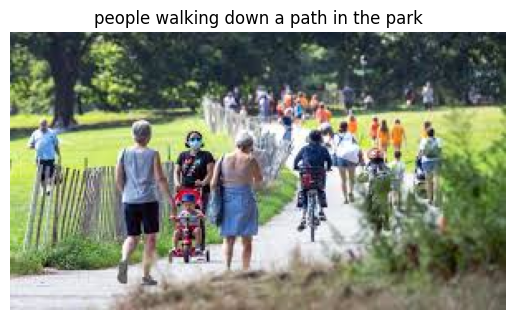

a man sitting under a tree in a park


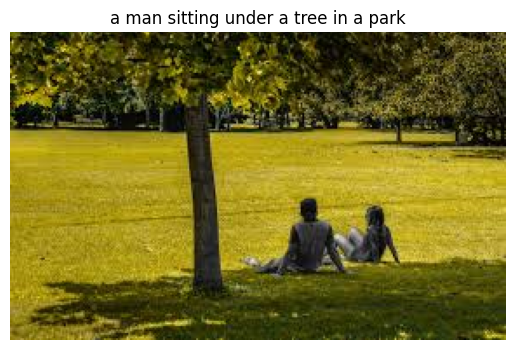

a group of people sitting on a bench


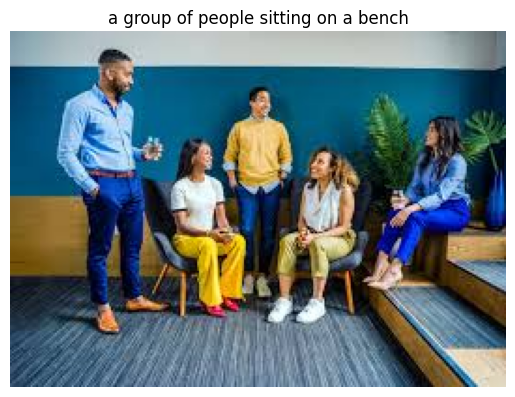

a group of children sitting on a hamster


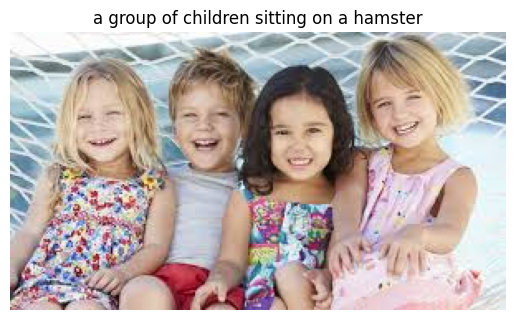

a playground with a red slide and a green slide


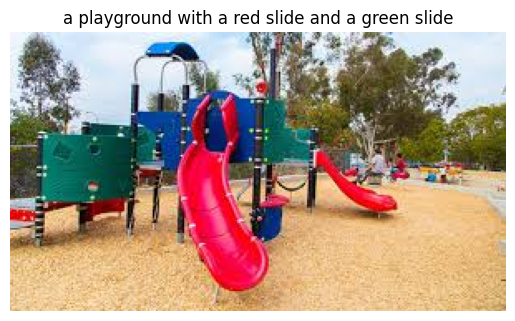

a table filled with lots of different types of fruit


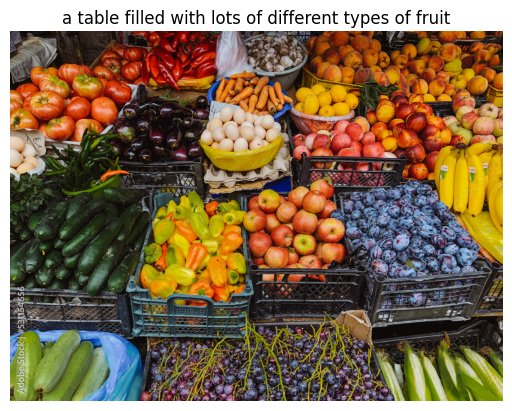

In [5]:
# Generate captions for the images
captions_gen = []
for image in images:
    inputs = processor(images=image, return_tensors="pt")
    out = model.generate(**inputs)
    caption = processor.decode(out[0], skip_special_tokens=True)
    captions_gen.append(caption)


for i, image in enumerate(images):
    print(captions_gen[i])
    plt.imshow(np.asarray(image))
    plt.title(captions_gen[i])
    plt.axis('off')
    plt.show()


In [6]:
print("Generated Captions:", captions_gen)

Generated Captions: ['an elephant standing on a hill with a blue sky in the background', 'a woman in a boat with a book', 'a puppy sitting in the grass', 'a tab cat lying down on the floor', 'a highway with cars', 'a mother elephant and her baby walking through the grass', 'a lion laying in the grass', 'toyota aur 1 5l at', 'cars 2 the movie', 'people walking down a path in the park', 'a man sitting under a tree in a park', 'a group of people sitting on a bench', 'a group of children sitting on a hamster', 'a playground with a red slide and a green slide', 'a table filled with lots of different types of fruit']


In [10]:
!pip install sentence_transformers

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinu

**Build an Image Search Engine**

Score: 0.4411


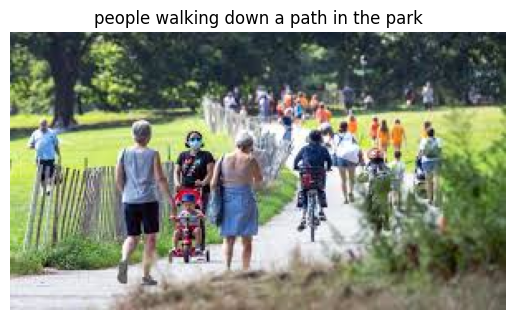

Score: 0.3968


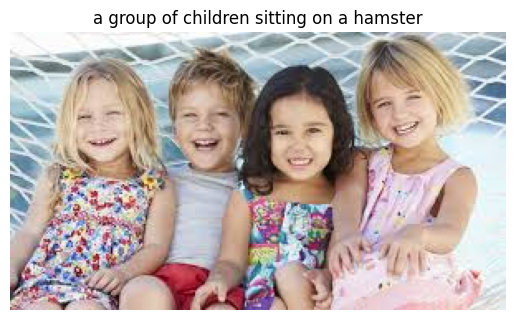

Score: 0.3932


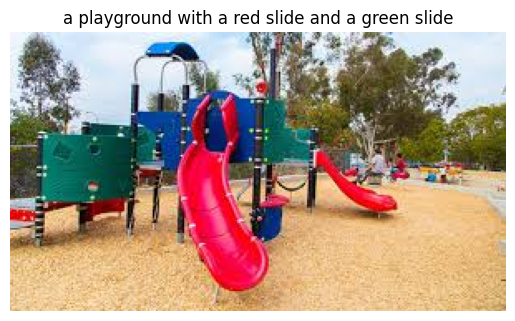

Score: 0.3317


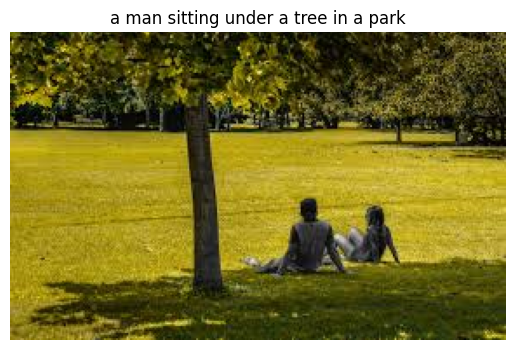

Score: 0.1497


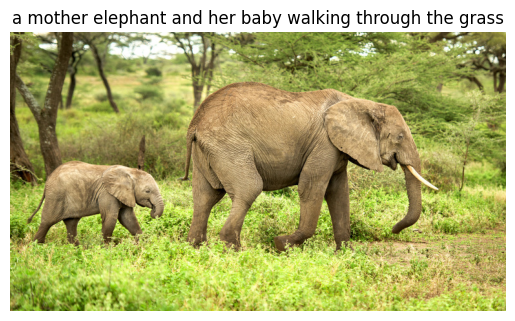

In [15]:
from sentence_transformers import SentenceTransformer, util
import numpy as np
embedder_cap = SentenceTransformer('all-MiniLM-L6-v2')

caption_embeddings = embedder_cap.encode(captions_gen, convert_to_tensor=True)

def search_images_eng(query, top_k=5):
    query_embedding = embedder_cap.encode(query, convert_to_tensor=True)
    cos_scores = util.pytorch_cos_sim(query_embedding, caption_embeddings)[0]
    top_results_img = np.argpartition(-cos_scores, range(top_k))[0:top_k]

    for idx in top_results_img:
        print(f"Score: {cos_scores[idx]:.4f}")
        plt.imshow(np.asarray(images[idx]))
        plt.title(captions_gen[idx])
        plt.axis('off')
        plt.show()


query_caption = "kids playing in the park"
search_images_eng(query_caption)